In [1]:
import pandas as pd
import numpy as np 

In [2]:
df = pd.read_csv('Covid19CountyStatisticsHPSCIreland.csv', parse_dates=['TimeStamp'])

In [3]:
df.head()

,OBJECTID,ORIGID,CountyName,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,ConfirmedCovidCases,PopulationProportionCovidCases,ConfirmedCovidDeaths,ConfirmedCovidRecovered,Shape__Area,Shape__Length
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06


In [4]:
df.tail()

,OBJECTID,ORIGID,CountyName,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,ConfirmedCovidCases,PopulationProportionCovidCases,ConfirmedCovidDeaths,ConfirmedCovidRecovered,Shape__Area,Shape__Length
13495,13496,2,Cavan,76176,2021-08-01 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,5785,7594.255409,NaN,NaN,5.575010e+09,5.159545e+05
13496,13497,3,Clare,118817,2021-08-01 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,5614,4724.913102,NaN,NaN,8.722542e+09,1.013949e+06
13497,13498,4,Cork,542868,2021-08-01 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,26325,4849.245120,NaN,NaN,1.952949e+10,2.129949e+06
13498,13499,5,Donegal,159192,2021-08-01 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,14236,8942.660435,NaN,NaN,1.462404e+10,2.145086e+06
13499,13500,6,Dublin,1347359,2021-08-01 00:00:00+00:00,313762,235813,53.3605,-6.2920,http://data.geohive.ie/resource/county/2ae1962...,107156,7953.039984,NaN,NaN,2.612633e+09,4.494335e+05


In [5]:
df.shape


(13500, 16)

In [6]:
df.PopulationCensus16.nunique()

26

In [7]:
df.rename(columns={'CountyName':'County','ConfirmedCovidCases':'Confirmed','PopulationProportionCovidCases':'Proportion',
                   'ConfirmedCovidDeaths':'Deaths','ConfirmedCovidRecovered':'Recovered'},inplace=True)

In [8]:
df

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13495,13496,2,Cavan,76176,2021-08-01 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,5785,7594.255409,NaN,NaN,5.575010e+09,5.159545e+05
13496,13497,3,Clare,118817,2021-08-01 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,5614,4724.913102,NaN,NaN,8.722542e+09,1.013949e+06
13497,13498,4,Cork,542868,2021-08-01 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,26325,4849.245120,NaN,NaN,1.952949e+10,2.129949e+06
13498,13499,5,Donegal,159192,2021-08-01 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,14236,8942.660435,NaN,NaN,1.462404e+10,2.145086e+06


In [9]:
df.Shape__Area.nunique()

26

In [10]:
df.groupby('County')[['Confirmed','Deaths', 'Recovered']].sum().reset_index()


,County,Confirmed,Deaths,Recovered
0,Carlow,659573,0.0,0.0
1,Cavan,1357100,0.0,0.0
2,Clare,1193805,0.0,0.0
3,Cork,5420968,0.0,0.0
4,Donegal,2387869,0.0,0.0
5,Dublin,22209773,0.0,0.0
6,Galway,2350679,0.0,0.0
7,Kerry,1095189,0.0,0.0
8,Kildare,3003792,0.0,0.0
9,Kilkenny,880761,0.0,0.0


<AxesSubplot:xlabel='County'>

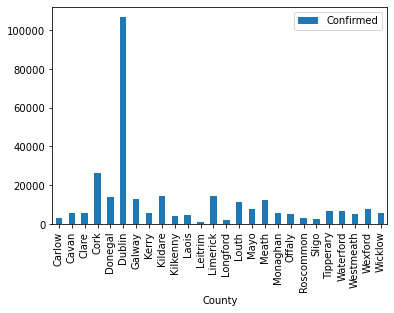

In [11]:
a = df.query('TimeStamp=="2021/07/31 00:00:00+00"').groupby('County')[['Confirmed', 'Deaths','Recovered']].sum().reset_index()
a.plot(x='County', y='Confirmed',kind='bar' )

In [12]:
df.query('TimeStamp=="2021/08/1 00:00:00+00"').groupby('County')[['Confirmed', 'Deaths','Recovered']].sum().reset_index()

,County,Confirmed,Deaths,Recovered
0,Carlow,3384,0.0,0.0
1,Cavan,5785,0.0,0.0
2,Clare,5614,0.0,0.0
3,Cork,26325,0.0,0.0
4,Donegal,14236,0.0,0.0
5,Dublin,107156,0.0,0.0


In [13]:
d = df.groupby(['TimeStamp','County']).sum().reset_index()
d.head(135)

,TimeStamp,County,OBJECTID,ORIGID,PopulationCensus16,IGEasting,IGNorthing,Lat,Long,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,2020-02-27 00:00:00+00:00,Carlow,1,1,56932,278661,163444,52.7168,-6.8367,0,0.000000,0.0,0.0,2.432352e+09,3.193486e+05
1,2020-02-27 00:00:00+00:00,Cavan,2,2,76176,246380,304501,53.9878,-7.2937,0,0.000000,0.0,0.0,5.575010e+09,5.159545e+05
2,2020-02-27 00:00:00+00:00,Clare,3,3,118817,133493,182732,52.8917,-8.9889,0,0.000000,0.0,0.0,8.722542e+09,1.013949e+06
3,2020-02-27 00:00:00+00:00,Cork,4,4,542868,156242,77860,51.9517,-8.6372,0,0.000000,0.0,0.0,1.952949e+10,2.129949e+06
4,2020-02-27 00:00:00+00:00,Donegal,5,5,159192,202615,405691,54.8989,-7.9600,0,0.000000,0.0,0.0,1.462404e+10,2.145086e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,2020-03-05 00:00:00+00:00,Carlow,131,1,56932,278661,163444,52.7168,-6.8367,0,0.000000,0.0,0.0,2.432352e+09,3.193486e+05
131,2020-03-05 00:00:00+00:00,Cavan,132,2,76176,246380,304501,53.9878,-7.2937,0,0.000000,0.0,0.0,5.575010e+09,5.159545e+05
132,2020-03-05 00:00:00+00:00,Clare,133,3,118817,133493,182732,52.8917,-8.9889,4,3.366522,0.0,0.0,8.722542e+09,1.013949e+06
133,2020-03-05 00:00:00+00:00,Cork,134,4,542868,156242,77860,51.9517,-8.6372,1,0.184207,0.0,0.0,1.952949e+10,2.129949e+06


In [14]:
# find the first position of not equal to zero.
df.Confirmed.ne(0).idxmax()

57

In [15]:
df.iloc[55:60]

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
55,56,4,Cork,542868,2020-03-02 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.952949e+10,2.129949e+06
56,57,5,Donegal,159192,2020-03-02 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.462404e+10,2.145086e+06
57,58,6,Dublin,1347359,2020-03-02 00:00:00+00:00,313762,235813,53.3605,-6.2920,http://data.geohive.ie/resource/county/2ae1962...,1,0.074219,NaN,NaN,2.612633e+09,4.494335e+05
58,59,7,Galway,258058,2020-03-02 00:00:00+00:00,151045,235818,53.3705,-8.7362,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.707916e+10,1.972288e+06
59,60,8,Kerry,147707,2020-03-02 00:00:00+00:00,92975,102996,52.1689,-9.5650,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.248360e+10,1.753780e+06


In [16]:
#Wrong
df = df[(df['TimeStamp'] <= '2021-07-31 00:00:00+00:00')]
df.tail()

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,781276.579658
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,643184.903993
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,422669.332716
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,589324.476745
13493,13494,26,Wicklow,142425,2021-07-31 00:00:00+00:00,311162,197894,53.0205,-6.3442,http://data.geohive.ie/resource/county/2ae1962...,5752,4038.616816,NaN,NaN,5.580729e+09,427539.198567


In [17]:
df

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,7.812766e+05
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,6.431849e+05
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,4.226693e+05
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,5.893245e+05


## Visuals

In [18]:
confirmed = df.groupby('TimeStamp')['Confirmed'].sum().reset_index()
confirmed

,TimeStamp,Confirmed
0,2020-02-27 00:00:00+00:00,0
1,2020-03-01 00:00:00+00:00,0
2,2020-03-02 00:00:00+00:00,1
3,2020-03-03 00:00:00+00:00,2
4,2020-03-04 00:00:00+00:00,5
...,...,...
514,2021-07-27 00:00:00+00:00,295513
515,2021-07-28 00:00:00+00:00,296872
516,2021-07-29 00:00:00+00:00,298365
517,2021-07-30 00:00:00+00:00,299790


In [19]:
import matplotlib.pyplot as plt

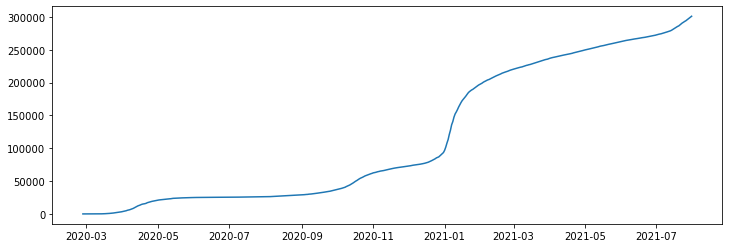

In [20]:
# removed the last day as it is incomplete
plt.figure(figsize=(12,4))
plt.plot(confirmed['TimeStamp'], confirmed['Confirmed'])

In [21]:
confirmed.tail()

,TimeStamp,Confirmed
514,2021-07-27 00:00:00+00:00,295513
515,2021-07-28 00:00:00+00:00,296872
516,2021-07-29 00:00:00+00:00,298365
517,2021-07-30 00:00:00+00:00,299790
518,2021-07-31 00:00:00+00:00,301075


In [22]:
import plotly.graph_objects as go
import plotly.express as px
import datetime

In [23]:
df['Date'] = [datetime.datetime.date(d) for d in df['TimeStamp']]
df['Date'] = df['Date'].astype(str)
df

<ipython-input-23-dcae6fdf54de>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = [datetime.datetime.date(d) for d in df['TimeStamp']]
<ipython-input-23-dcae6fdf54de>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = df['Date'].astype(str)


,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length,Date
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05,2020-02-27
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05,2020-02-27
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06,2020-02-27
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06,2020-02-27
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06,2020-02-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,7.812766e+05,2021-07-31
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,6.431849e+05,2021-07-31
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,4.226693e+05,2021-07-31
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,5.893245e+05,2021-07-31


In [24]:
fig = px.density_mapbox(df, 
                        lat="Lat", 
                        lon="Long", 
                        hover_name="County", 
                        z=df.Confirmed, 
                        animation_frame="Date",
                        radius=30,
                        range_color=(0,6000),
                        zoom=5,height=800)

fig.update_layout(title='Ireland Corona Virus Cases Time Lapse - Confirmed',
                  font=dict(family="Courier New, monospace",
                            size=20,
                            color="#7f7f7f")
                 )

fig.update_layout(mapbox_style="open-street-map")
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})


fig.show()

In [25]:
df.Date.dtypes

dtype('O')

## Analysis by County

In [26]:
counties_affected = df.County.unique()
print('Number of counties affected: '+ str(len(counties_affected)))
print('Name of Counties affected: ')
for i in counties_affected:
    print(i)

Number of counties affected: 26
Name of Counties affected: 
Carlow
Cavan
Clare
Cork
Donegal
Dublin
Galway
Kerry
Kildare
Kilkenny
Laois
Leitrim
Limerick
Longford
Louth
Mayo
Meath
Monaghan
Offaly
Roscommon
Sligo
Tipperary
Waterford
Westmeath
Wexford
Wicklow


In [27]:
import pycountry

In [28]:
pycountry.countries.search_fuzzy('Ireland')

[Country(alpha_2='IE', alpha_3='IRL', name='Ireland', numeric='372'),
 Country(alpha_2='GB', alpha_3='GBR', name='United Kingdom', numeric='826', official_name='United Kingdom of Great Britain and Northern Ireland'),
 Country(alpha_2='PG', alpha_3='PNG', name='Papua New Guinea', numeric='598', official_name='Independent State of Papua New Guinea')]

In [29]:
ie = pycountry.subdivisions.get(country_code='IE')
len(ie)

30

In [30]:
print(ie)

{Subdivision(code='IE-LH', country_code='IE', name='Louth', parent='L', parent_code='IE-L', type='County'), Subdivision(code='IE-LK', country_code='IE', name='Limerick', parent='M', parent_code='IE-M', type='County'), Subdivision(code='IE-LM', country_code='IE', name='Leitrim', parent='C', parent_code='IE-C', type='County'), Subdivision(code='IE-LS', country_code='IE', name='Laois', parent='L', parent_code='IE-L', type='County'), Subdivision(code='IE-M', country_code='IE', name='Munster', parent_code=None, type='Province'), Subdivision(code='IE-MH', country_code='IE', name='Meath', parent='L', parent_code='IE-L', type='County'), Subdivision(code='IE-MN', country_code='IE', name='Monaghan', parent='U', parent_code='IE-U', type='County'), Subdivision(code='IE-C', country_code='IE', name='Connacht', parent_code=None, type='Province'), Subdivision(code='IE-MO', country_code='IE', name='Mayo', parent='C', parent_code='IE-C', type='County'), Subdivision(code='IE-OY', country_code='IE', name=

In [31]:
print(list(county.name for county in ie))

['Louth', 'Limerick', 'Leitrim', 'Laois', 'Munster', 'Meath', 'Monaghan', 'Connacht', 'Mayo', 'Offaly', 'Clare', 'Roscommon', 'Sligo', 'Cavan', 'Tipperary', 'Cork', 'Ulster', 'Carlow', 'Dublin', 'Waterford', 'Donegal', 'Galway', 'Westmeath', 'Kildare', 'Wicklow', 'Wexford', 'Kilkenny', 'Kerry', 'Leinster', 'Longford']


In [32]:
df

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length,Date
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05,2020-02-27
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05,2020-02-27
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06,2020-02-27
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06,2020-02-27
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06,2020-02-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,7.812766e+05,2021-07-31
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,6.431849e+05,2021-07-31
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,4.226693e+05,2021-07-31
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,5.893245e+05,2021-07-31


In [33]:
df2=df.groupby(['Date','County' ])[['Date','County', 'Confirmed']].sum().reset_index()
df2

,Date,County,Confirmed
0,2020-02-27,Carlow,0
1,2020-02-27,Cavan,0
2,2020-02-27,Clare,0
3,2020-02-27,Cork,0
4,2020-02-27,Donegal,0
...,...,...,...
13489,2021-07-31,Tipperary,6788
13490,2021-07-31,Waterford,6505
13491,2021-07-31,Westmeath,4969
13492,2021-07-31,Wexford,7992


In [34]:
df.groupby('Date').sum().reset_index()

,Date,OBJECTID,ORIGID,PopulationCensus16,IGEasting,IGNorthing,Lat,Long,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,2020-02-27,351,351,4761865,5756196,5888739,1385.4073,-199.637,0,0.000000,0.0,0.0,1.935829e+11,2.114830e+07
1,2020-03-01,1027,351,4761865,5756196,5888739,1385.4073,-199.637,0,0.000000,0.0,0.0,1.935829e+11,2.114830e+07
2,2020-03-02,1703,351,4761865,5756196,5888739,1385.4073,-199.637,1,0.074219,0.0,0.0,1.935829e+11,2.114830e+07
3,2020-03-03,2379,351,4761865,5756196,5888739,1385.4073,-199.637,2,0.850111,0.0,0.0,1.935829e+11,2.114830e+07
4,2020-03-04,3055,351,4761865,5756196,5888739,1385.4073,-199.637,5,3.375002,0.0,0.0,1.935829e+11,2.114830e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,2021-07-27,347815,351,4761865,5756196,5888739,1385.4073,-199.637,295513,148337.815697,0.0,0.0,1.935829e+11,2.114830e+07
515,2021-07-28,348491,351,4761865,5756196,5888739,1385.4073,-199.637,296872,149030.490239,0.0,0.0,1.935829e+11,2.114830e+07
516,2021-07-29,349167,351,4761865,5756196,5888739,1385.4073,-199.637,298365,149789.076654,0.0,0.0,1.935829e+11,2.114830e+07
517,2021-07-30,349843,351,4761865,5756196,5888739,1385.4073,-199.637,299790,150522.021107,0.0,0.0,1.935829e+11,2.114830e+07


In [35]:
c=df.groupby(['Date','County'])[['Confirmed', 'Lat', 'Long']].sum().reset_index()
c

,Date,County,Confirmed,Lat,Long
0,2020-02-27,Carlow,0,52.7168,-6.8367
1,2020-02-27,Cavan,0,53.9878,-7.2937
2,2020-02-27,Clare,0,52.8917,-8.9889
3,2020-02-27,Cork,0,51.9517,-8.6372
4,2020-02-27,Donegal,0,54.8989,-7.9600
...,...,...,...,...,...
13489,2021-07-31,Tipperary,6788,52.6407,-7.9206
13490,2021-07-31,Waterford,6505,52.2035,-7.4935
13491,2021-07-31,Westmeath,4969,53.5524,-7.4219
13492,2021-07-31,Wexford,7992,52.5164,-6.5037


In [36]:
county_confirmed=df2.groupby(['Date','County']).sum()[['Confirmed']].reset_index()
county_confirmed

,Date,County,Confirmed
0,2020-02-27,Carlow,0
1,2020-02-27,Cavan,0
2,2020-02-27,Clare,0
3,2020-02-27,Cork,0
4,2020-02-27,Donegal,0
...,...,...,...
13489,2021-07-31,Tipperary,6788
13490,2021-07-31,Waterford,6505
13491,2021-07-31,Westmeath,4969
13492,2021-07-31,Wexford,7992


In [37]:
counties = {}
for county in ie:
    counties[county.name] = county
    
#confirmed2["iso_alpha"] = confirmed2["Country"].map(countries.get)
#deaths2["iso_alpha"] = deaths2["Country"].map(countries.get)
#recovered2["iso_alpha"] = recovered2["Country"].map(countries.get)

In [38]:
county_confirmed["iso_alpha"] = county_confirmed["County"].map(counties.get)

In [39]:
plot_data_confirmed = county_confirmed[["iso_alpha","Confirmed", "County"]]

In [74]:
import json
ireland_county = json.load(open('ireland-counties.geojson','r',encoding="utf-8"))

In [77]:
ireland_county

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'name': 'Limerick City',
    'cartodb_id': 1,
    'created_at': '2014-01-25T10:04:56Z',
    'updated_at': '2014-01-25T10:04:57Z'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[-8.653917, 52.689985],
       [-8.65268, 52.689282],
       [-8.649123, 52.689353],
       [-8.646816, 52.688701],
       [-8.64144, 52.688337],
       [-8.64025, 52.68676],
       [-8.636081, 52.687697],
       [-8.635944, 52.687351],
       [-8.636513, 52.687207],
       [-8.637148, 52.685872],
       [-8.633201, 52.684658],
       [-8.63293, 52.685094],
       [-8.630895, 52.68491],
       [-8.628881, 52.684121],
       [-8.6272, 52.684097],
       [-8.627147, 52.686091],
       [-8.627204, 52.687494],
       [-8.626258, 52.688432],
       [-8.625061, 52.688814],
       [-8.621187, 52.689063],
       [-8.618385, 52.68893],
       [-8.613994, 52.686705],
       [-8.612806, 52.684838],
       [-8.612548, 52.684369

In [78]:
ireland_county['features'][0].keys()

dict_keys(['type', 'properties', 'geometry'])

In [79]:
ireland_county['features'][0]

{'type': 'Feature',
 'properties': {'name': 'Limerick City',
  'cartodb_id': 1,
  'created_at': '2014-01-25T10:04:56Z',
  'updated_at': '2014-01-25T10:04:57Z'},
 'geometry': {'type': 'MultiPolygon',
  'coordinates': [[[[-8.653917, 52.689985],
     [-8.65268, 52.689282],
     [-8.649123, 52.689353],
     [-8.646816, 52.688701],
     [-8.64144, 52.688337],
     [-8.64025, 52.68676],
     [-8.636081, 52.687697],
     [-8.635944, 52.687351],
     [-8.636513, 52.687207],
     [-8.637148, 52.685872],
     [-8.633201, 52.684658],
     [-8.63293, 52.685094],
     [-8.630895, 52.68491],
     [-8.628881, 52.684121],
     [-8.6272, 52.684097],
     [-8.627147, 52.686091],
     [-8.627204, 52.687494],
     [-8.626258, 52.688432],
     [-8.625061, 52.688814],
     [-8.621187, 52.689063],
     [-8.618385, 52.68893],
     [-8.613994, 52.686705],
     [-8.612806, 52.684838],
     [-8.612548, 52.684369],
     [-8.611184, 52.682625],
     [-8.609959, 52.681222],
     [-8.608278, 52.6796],
     [-8.60435

In [81]:
county_id_map= {}

for feature in ireland_county['features']:
    feature['id']=feature['properties']['cartodb_id']
    county_id_map[feature['properties']['name']]=feature['id']

In [82]:
county_id_map

{'Limerick City': 1,
 'Limerick County': 2,
 'North Tipperary': 3,
 'South Tipperary': 4,
 'Waterford City': 5,
 'Waterford County': 6,
 'Galway City': 7,
 'Galway County': 8,
 'Leitrim County': 9,
 'Mayo County': 10,
 'Roscommon County': 11,
 'Sligo County': 12,
 'Cavan County': 13,
 'Donegal County': 14,
 'Monaghan County': 15,
 'Carlow County': 16,
 'Dublin City': 17,
 'South Dublin': 18,
 'Fingal': 19,
 'Dún Laoghaire-Rathdown': 20,
 'Kildare County': 21,
 'Kilkenny County': 22,
 'Laois County': 23,
 'Longford County': 24,
 'Louth County': 25,
 'Meath County': 26,
 'Offaly County': 27,
 'Westmeath County': 28,
 'Wexford County': 29,
 'Wicklow County': 30,
 'Clare County': 31,
 'Cork City': 32,
 'Cork County': 33,
 'Kerry County': 34}

In [84]:
county_confirmed['County'].unique()

array(['Carlow', 'Cavan', 'Clare', 'Cork', 'Donegal', 'Dublin', 'Galway',
       'Kerry', 'Kildare', 'Kilkenny', 'Laois', 'Leitrim', 'Limerick',
       'Longford', 'Louth', 'Mayo', 'Meath', 'Monaghan', 'Offaly',
       'Roscommon', 'Sligo', 'Tipperary', 'Waterford', 'Westmeath',
       'Wexford', 'Wicklow'], dtype=object)

In [83]:
county_confirmed['id'] = county_confirmed['County'].apply(lambda x: county_id_map[x])

KeyError: 'Carlow'

In [61]:
fig = px.choropleth(county_confirmed, locations='id',geojson='ireland_county', color='Confirmed', scope='europe')
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

In [63]:
px.choropleth_mapbox(county_confirmed, locations='id',geojson='ireland_county', color='Confirmed')

In [48]:
county_confirmed

,Date,County,Confirmed,iso_alpha,id
0,2020-02-27,Carlow,0,"Subdivision(code='IE-CW', country_code='IE', n...",-285977.0
1,2020-02-27,Cavan,0,"Subdivision(code='IE-CN', country_code='IE', n...",-283679.0
2,2020-02-27,Clare,0,"Subdivision(code='IE-CE', country_code='IE', n...",-334885.0
3,2020-02-27,Cork,0,"Subdivision(code='IE-CO', country_code='IE', n...",-332631.0
4,2020-02-27,Donegal,0,"Subdivision(code='IE-DL', country_code='IE', n...",-283732.0
...,...,...,...,...,...
13489,2021-07-31,Tipperary,6788,"Subdivision(code='IE-TA', country_code='IE', n...",-334372.0
13490,2021-07-31,Waterford,6505,"Subdivision(code='IE-WD', country_code='IE', n...",-283426.0
13491,2021-07-31,Westmeath,4969,"Subdivision(code='IE-WH', country_code='IE', n...",-335446.0
13492,2021-07-31,Wexford,7992,"Subdivision(code='IE-WX', country_code='IE', n...",-285981.0
